# Курсовой проект для курса "Python для Data Science"

Задание для курсового проекта - Real Estate Price Prediction

Сдача проекта:
1. Прислать в раздел Задания Урока 10 ("Вебинар. Консультация по итоговому проекту")
**ссылку на файл Jupyter Notebook**. (Pull request не нужен).
2. Приложить файл с названием по образцу **YourName_predictions.csv**
с предсказанными ценами для квартир из test.csv (файл должен содержать два поля: Id, Price).
В файле с предсказаниями должна быть 5001 строка (шапка + 5000 предсказаний). 

Сроки и условия сдачи:

1. Сдать проект нужно в течение **72 часов** после начала Урока 10 ("Вебинар. Консультация по итоговому проекту").
2. Для успешной сдачи должны быть все предсказания (для 5000 квартир) и R2 (sklearn.metrics.r2_score) должен быть **больше 0.65**.
3. При сдаче до дедлайна результат проекта может попасть в топ лучших результатов.
Повторная сдача и проверка результатов возможны только при условии предыдущей неуспешной сдачи.
Успешный проект нельзя пересдать в целях повышения результата. В качестве итогового результата берется первый успешный результат, последующие успешные результаты не учитываются.
4. Проекты, сданные после дедлайна или сданные повторно, не попадают в топ лучших результатов, но можно узнать результат.

Рекомендации для файла с кодом (ipynb):
1. Файл должен содержать заголовки и комментарии
2. Повторяющиеся операции лучше оформлять в виде функций
3. Не делать вывод большого количества строк таблиц (5-10 достаточно)
4. Хорошо добавлять графики, поясняющие принятые решения (около 3-5)
5. Добавлять только лучшую модель, то есть не включать в код все варианты решения проекта
6. Скрипт проекта должен отрабатывать от начала и до конца (от загрузки данных до выгрузки предсказаний)
7. При использовании статистик (среднее, медиана и т.д.) в качестве признаков,
считать их на трейне и использовать на контрольных и тестовых данных. 
8. Оценку качества модели можно выполнять на отложенной выборки или использовать кросс-валидацию. Также рекомендуется самостоятельно проверять точность предсказания на https://www.kaggle.com/c/realestatepriceprediction.
9. Проект должен полностью отрабатывать за разумное время (не больше 10 минут),
поэтому в финальный вариант лучше не включать GridSearchCV с перебором 
параметров, а сразу использовать подобранные параметры.
10. Допускается применение библиотек Python и моделей машинного обучения,
которые были в курсе Библиотеки Python для Data Science. 

## Подключение библиотек

Импорт всех необходимых библиотек

In [220]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold, GridSearchCV

warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', 50)

plt.style.use('fivethirtyeight')

sns.set(style='whitegrid')
sns.set_context("paper", font_scale=1.5)

%config InlineBackend.figure_format = 'svg'
%matplotlib inline

## Объявление вспомогательных функций

In [2]:
# функция рисует scatter-график по двум признакам
def draw_scatter(column_x, column_y, df):
    plt.scatter(df[column_x], df[column_y])
    plt.xlabel(column_x)
    plt.ylabel(column_y)
    plt.show()

## Загрузка данных

In [137]:
train_df = pd.read_csv('train.csv', index_col='Id')
train_df.head()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
Id,,,,,,,,,,,,,,,,,,,
14038,35,2.0,47.981561,29.442751,6.0,7,9.0,1969,0.089040,B,B,33,7976,5,NaN,0,11,B,184966.930730
15053,41,3.0,65.683640,40.049543,8.0,7,9.0,1978,0.000070,B,B,46,10309,1,240.0,1,16,B,300009.450063
4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,0.049637,B,B,34,7759,0,229.0,1,3,B,220925.908524
5809,58,2.0,53.352981,52.731512,9.0,8,17.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,175616.227217
10783,99,1.0,39.649192,23.776169,7.0,11,12.0,1976,0.012339,B,B,35,5776,1,2078.0,2,4,B,150226.531644


In [138]:
test_df = pd.read_csv('test.csv', index_col='Id')
test_df.head()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2
Id,,,,,,,,,,,,,,,,,,
725,58,2.0,49.882643,33.432782,6.0,6,14.0,1972,0.310199,B,B,11,2748,1,NaN,0,0,B
15856,74,2.0,69.263183,NaN,1.0,6,1.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B
5480,190,1.0,13.597819,15.948246,12.0,2,5.0,1909,0.000000,B,B,30,7538,87,4702.0,5,5,B
15664,47,2.0,73.046609,51.940842,9.0,22,22.0,2007,0.101872,B,B,23,4583,3,NaN,3,3,B
14275,27,1.0,47.527111,43.387569,1.0,17,17.0,2017,0.072158,B,B,2,629,1,NaN,0,0,A


In [139]:
train_df.shape, test_df.shape

((10000, 19), (5000, 18))

## Обработка данных

In [140]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 14038 to 6306
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   DistrictId     10000 non-null  int64  
 1   Rooms          10000 non-null  float64
 2   Square         10000 non-null  float64
 3   LifeSquare     7887 non-null   float64
 4   KitchenSquare  10000 non-null  float64
 5   Floor          10000 non-null  int64  
 6   HouseFloor     10000 non-null  float64
 7   HouseYear      10000 non-null  int64  
 8   Ecology_1      10000 non-null  float64
 9   Ecology_2      10000 non-null  object 
 10  Ecology_3      10000 non-null  object 
 11  Social_1       10000 non-null  int64  
 12  Social_2       10000 non-null  int64  
 13  Social_3       10000 non-null  int64  
 14  Healthcare_1   5202 non-null   float64
 15  Helthcare_2    10000 non-null  int64  
 16  Shops_1        10000 non-null  int64  
 17  Shops_2        10000 non-null  object 
 18  Pri

In [141]:
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
DistrictId,10000.0,50.400800,43.587592,0.000000,20.000000,36.000000,75.000000,2.090000e+02
Rooms,10000.0,1.890500,0.839512,0.000000,1.000000,2.000000,2.000000,1.900000e+01
Square,10000.0,56.315775,21.058732,1.136859,41.774881,52.513310,65.900625,6.410652e+02
LifeSquare,7887.0,37.199645,86.241209,0.370619,22.769832,32.781260,45.128803,7.480592e+03
KitchenSquare,10000.0,6.273300,28.560917,0.000000,1.000000,6.000000,9.000000,2.014000e+03
Floor,10000.0,8.526700,5.241148,1.000000,4.000000,7.000000,12.000000,4.200000e+01
HouseFloor,10000.0,12.609400,6.775974,0.000000,9.000000,13.000000,17.000000,1.170000e+02
HouseYear,10000.0,3990.166300,200500.261427,1910.000000,1974.000000,1977.000000,2001.000000,2.005201e+07
Ecology_1,10000.0,0.118858,0.119025,0.000000,0.017647,0.075424,0.195781,5.218671e-01
Social_1,10000.0,24.687000,17.532614,0.000000,6.000000,25.000000,36.000000,7.400000e+01


In [142]:
train_df.nunique()

DistrictId         205
Rooms                9
Square           10000
LifeSquare        7887
KitchenSquare       58
Floor               33
HouseFloor          44
HouseYear           97
Ecology_1          129
Ecology_2            2
Ecology_3            2
Social_1            51
Social_2           142
Social_3            30
Healthcare_1        79
Helthcare_2          7
Shops_1             16
Shops_2              2
Price            10000
dtype: int64

### Посмотрим на целевую переменную

Text(0.5, 0, 'Price')

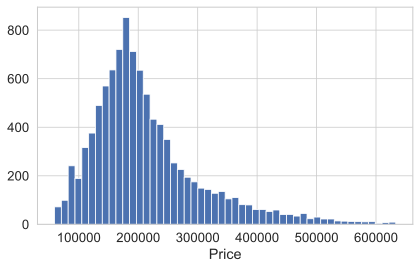

In [143]:
train_df['Price'].hist(bins=50)
plt.xlabel('Price')

### Преобразуем переменные

Начнём с 'Ecology_2', 'Ecology_3' и 'Shops_2', судя по результатам ```train_df.nunique()``` - это категориальные переменные, которые принимают всего два значения

In [144]:
train_df['Ecology_2'].value_counts()

B    9903
A      97
Name: Ecology_2, dtype: int64

In [145]:
train_df['Ecology_3'].value_counts()

B    9725
A     275
Name: Ecology_3, dtype: int64

In [146]:
train_df['Shops_2'].value_counts()

B    9175
A     825
Name: Shops_2, dtype: int64

Заменим A на 0, а B на 1. Изначально делал замену на булевую true/false, но на консультации объяснили, что для модели лучше использвать числовые

In [147]:
replaced_params = ['Ecology_2', 'Ecology_3', 'Shops_2']
train_df[replaced_params] = train_df[replaced_params].replace({'A':0, 'B':1})
test_df[replaced_params] = test_df[replaced_params].replace({'A':0, 'B':1})

train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 14038 to 6306
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   DistrictId     10000 non-null  int64  
 1   Rooms          10000 non-null  float64
 2   Square         10000 non-null  float64
 3   LifeSquare     7887 non-null   float64
 4   KitchenSquare  10000 non-null  float64
 5   Floor          10000 non-null  int64  
 6   HouseFloor     10000 non-null  float64
 7   HouseYear      10000 non-null  int64  
 8   Ecology_1      10000 non-null  float64
 9   Ecology_2      10000 non-null  int64  
 10  Ecology_3      10000 non-null  int64  
 11  Social_1       10000 non-null  int64  
 12  Social_2       10000 non-null  int64  
 13  Social_3       10000 non-null  int64  
 14  Healthcare_1   5202 non-null   float64
 15  Helthcare_2    10000 non-null  int64  
 16  Shops_1        10000 non-null  int64  
 17  Shops_2        10000 non-null  int64  
 18  Pri

Посмотрим на boxplot-ы после замен

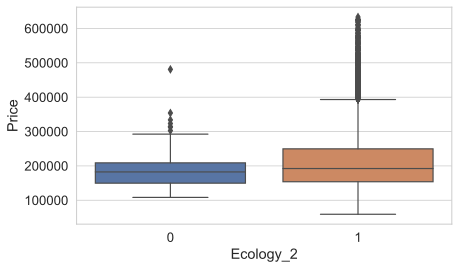

In [148]:
sns.boxplot('Ecology_2', 'Price', data=train_df)

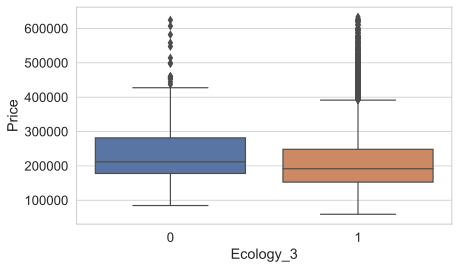

In [149]:
sns.boxplot('Ecology_3', 'Price', data=train_df)

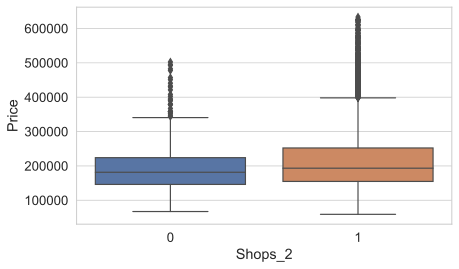

In [150]:
sns.boxplot('Shops_2', 'Price', data=train_df);

### Обработка пустых значений

In [151]:
train_df.isna().sum()[train_df.isna().sum() != 0]

LifeSquare      2113
Healthcare_1    4798
dtype: int64

#### Lifesquare

Установим зависимость между Lifesquare и Square

In [152]:
train_df['LifeSquare'].describe()

count    7887.000000
mean       37.199645
std        86.241209
min         0.370619
25%        22.769832
50%        32.781260
75%        45.128803
max      7480.592129
Name: LifeSquare, dtype: float64

In [153]:
train_df['Square'].describe()

count    10000.000000
mean        56.315775
std         21.058732
min          1.136859
25%         41.774881
50%         52.513310
75%         65.900625
max        641.065193
Name: Square, dtype: float64

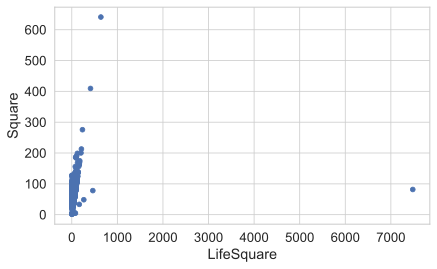

In [154]:
draw_scatter('LifeSquare', 'Square', train_df)

Оба признака имеют выбросы, для начала избавимся от них

In [155]:
train_df.loc[(train_df['LifeSquare'] > 400), 'LifeSquare'] = train_df['LifeSquare'].median()
test_df.loc[(test_df['LifeSquare'] > 400), 'LifeSquare'] = train_df['LifeSquare'].median()

In [156]:
train_df.loc[(train_df['Square'] > 400), 'Square'] = train_df['Square'].median()
test_df.loc[(test_df['Square'] > 400), 'Square'] = train_df['Square'].median()

Ещё раз посмотрим на график после замены

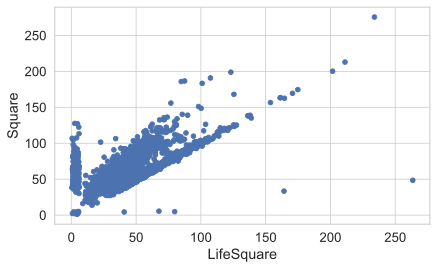

In [157]:
draw_scatter('LifeSquare', 'Square', train_df)

Посчитаем долю жилой площади от общей по средним значениям в выборке

In [158]:
square_mean_values = train_df[['Square', 'LifeSquare']].dropna().mean()
square_coef = square_mean_values[1] / square_mean_values[0]
square_coef

0.6545716097266717

Теперь заполним пропущенные значения в столбце LifeSquare с учётом рассчитанного коэффициента

In [159]:
train_df.loc[train_df['LifeSquare'].isnull(), 'LifeSquare'] = train_df['Square'] * square_coef
test_df.loc[test_df['LifeSquare'].isnull(), 'LifeSquare'] = test_df['Square'] * square_coef

#### Healthcare_1

Очень много пропусков, порядка 50% на train-е и на test-е, попробуем заменить медианой

In [160]:
train_df['Healthcare_1'].fillna(train_df['Healthcare_1'].median(), inplace=True)
test_df['Healthcare_1'].fillna(train_df['Healthcare_1'].median(), inplace=True)

### Обработка выбросов

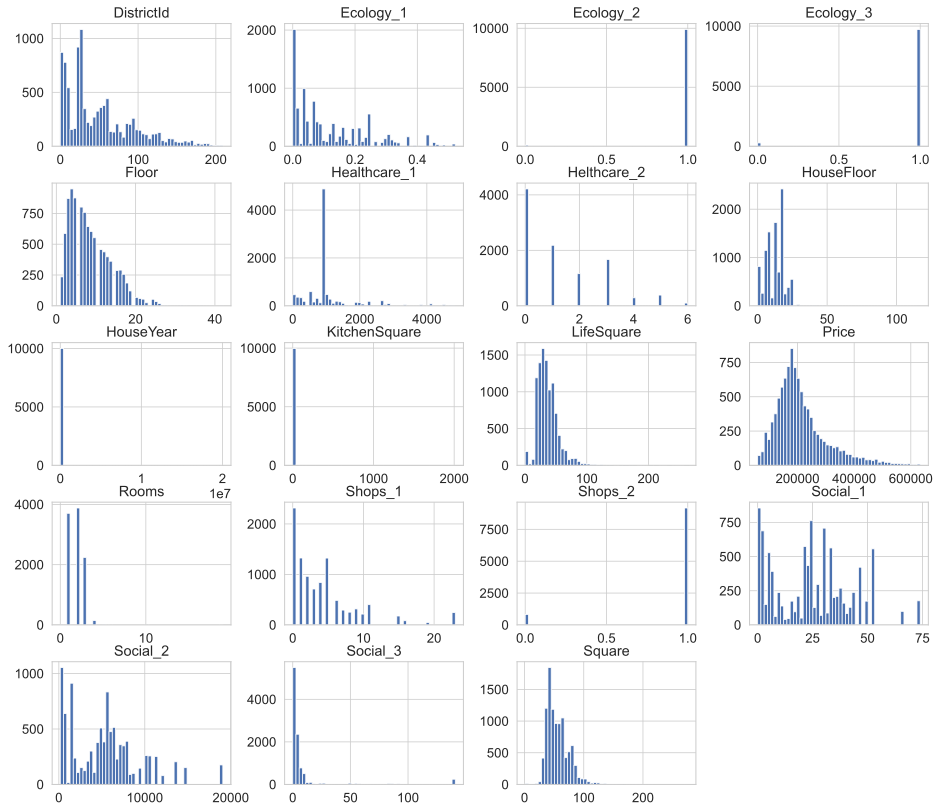

In [161]:
train_df.hist(figsize=(14,14), bins=50, grid=True);

#### HouseYear

In [162]:
train_df['HouseYear'].describe()

count    1.000000e+04
mean     3.990166e+03
std      2.005003e+05
min      1.910000e+03
25%      1.974000e+03
50%      1.977000e+03
75%      2.001000e+03
max      2.005201e+07
Name: HouseYear, dtype: float64

In [163]:
train_df['HouseYear'].sort_values(ascending=False)

Id
10814    20052011
11607        4968
6731         2020
8892         2020
14318        2020
           ...   
7920         1916
6751         1914
2085         1912
14556        1912
13288        1910
Name: HouseYear, Length: 10000, dtype: int64

Значение 20052011 явно дата,у которой сбит формат, заменим её на 2011

In [164]:
train_df.loc[train_df['HouseYear'] == 20052011, 'HouseYear'] = 2011

Все значения больше текущего года сделаем равными текущему году

In [165]:
train_df.loc[train_df['HouseYear'] > 2020, 'HouseYear'] = 2020

Посмотрим, что там test-е

In [166]:
test_df['HouseYear'].sort_values(ascending=False)

Id
2359     2020
8311     2020
8560     2020
9398     2020
4696     2020
         ... 
16217    1912
3726     1911
9076     1910
5480     1909
12316    1908
Name: HouseYear, Length: 5000, dtype: int64

Не test-е всё ок, не будем ничего изменять

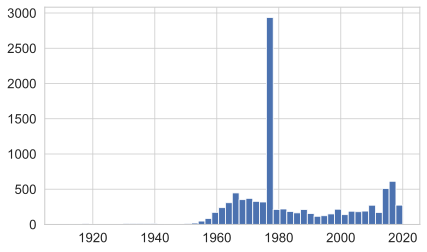

In [167]:
train_df['HouseYear'].hist(bins=50, grid=True);

#### Rooms

In [168]:
train_df['Rooms'].value_counts()

2.0     3880
1.0     3705
3.0     2235
4.0      150
5.0       18
0.0        8
10.0       2
19.0       1
6.0        1
Name: Rooms, dtype: int64

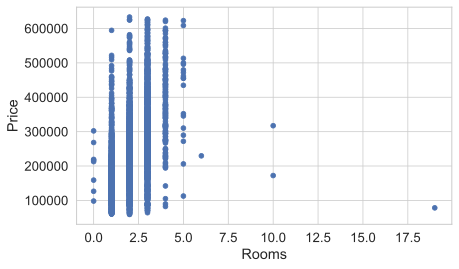

In [169]:
draw_scatter('Rooms', 'Price', train_df)

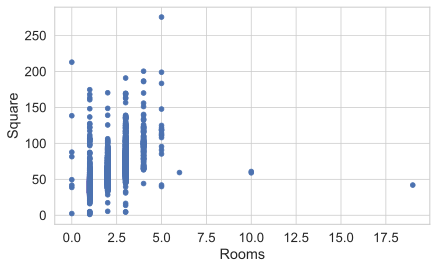

In [170]:
draw_scatter('Rooms', 'Square', train_df)

Квартира с 0 комнатами выглядит крайне подозрительно, так же как и квартиры с маленькой площадью, но большим количеством комнат, в нашем случае 6 и больше, заменим на моду

In [171]:
train_df.loc[(train_df['Rooms'] > 5)|(train_df['Rooms'] == 0), 'Rooms'] = train_df['Rooms'].mode()[0]
test_df.loc[(test_df['Rooms'] > 5)|(test_df['Rooms'] == 0), 'Rooms'] = train_df['Rooms'].mode()[0]

#### Square, LifeSquare, KitchenSquare
часть выбросов мы заменили в процессе работы с пустыми значениями LifeSquare, закончим

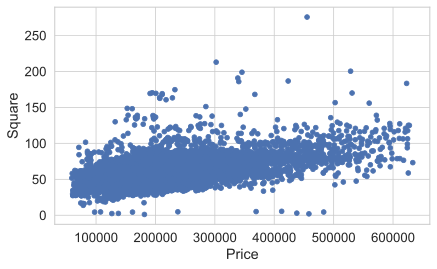

In [172]:
draw_scatter('Price', 'Square', train_df)

Заменим площади, которые меньше самой маленькой квартиры в Москве :) https://lenta.ru/news/2020/02/20/tiny_condos/

In [173]:
train_df.loc[(train_df['Square'] < 8.4), 'Square'] = train_df['Square'].median()
test_df.loc[(test_df['Square'] < 8.4), 'Square'] = train_df['Square'].median()

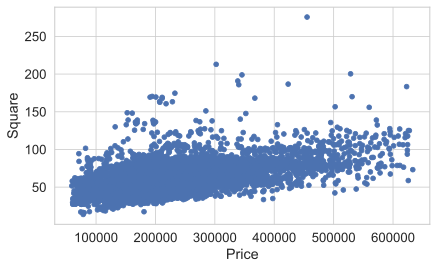

In [174]:
draw_scatter('Price', 'Square', train_df)

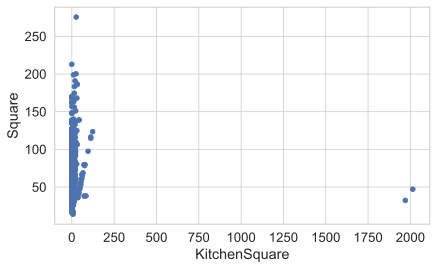

In [175]:
draw_scatter('KitchenSquare', 'Square', train_df)

Уберём два самых больших выброса из правой части графика

In [176]:
train_df.loc[(train_df['KitchenSquare'] > 250), 'KitchenSquare'] = train_df['KitchenSquare'].median()

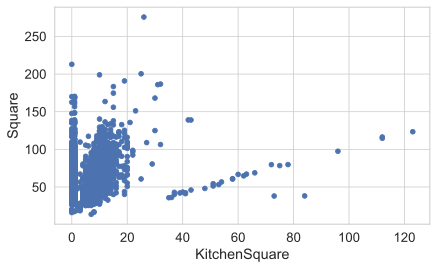

In [177]:
draw_scatter('KitchenSquare', 'Square', train_df)

Поправим площади больше 60м2 и больше общей площади квартиры

In [178]:
train_df.loc[(train_df['KitchenSquare'] > 60) | (train_df['KitchenSquare'] > train_df['Square']),
             'KitchenSquare'] = train_df['KitchenSquare'].median()

test_df.loc[(test_df['KitchenSquare'] > 60) | (test_df['KitchenSquare'] > test_df['Square']),
            'KitchenSquare'] = train_df['KitchenSquare'].median()

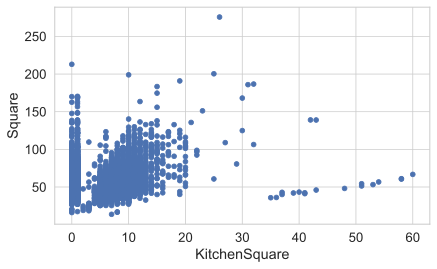

In [179]:
draw_scatter('KitchenSquare', 'Square', train_df)

Также уберём очень маленькие площади, предположим, что кухни меньше 3м2 не бывает

In [180]:
train_df.loc[(train_df['KitchenSquare'] < 3), 'KitchenSquare'] = train_df['KitchenSquare'].median()
test_df.loc[(test_df['KitchenSquare'] < 3), 'KitchenSquare'] = train_df['KitchenSquare'].median()

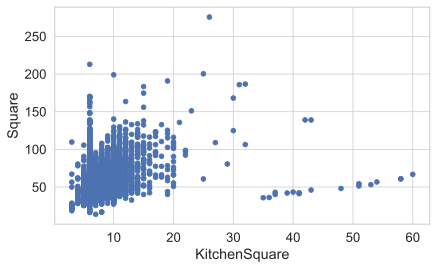

In [181]:
draw_scatter('KitchenSquare', 'Square', train_df)

#### HouseFloor, Floor

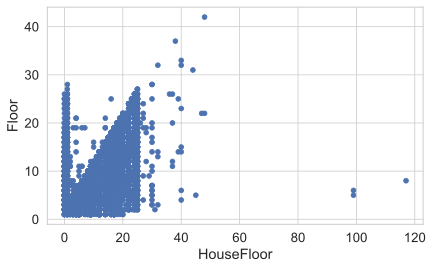

In [182]:
draw_scatter('HouseFloor', 'Floor', train_df)

Исправим дома с 0 этажами и выше 60

In [183]:
train_df.loc[(train_df['HouseFloor'] == 0) | (train_df['HouseFloor'] >= 60),
             'HouseFloor'] = train_df['HouseFloor'].mode()[0]
test_df.loc[(test_df['HouseFloor'] == 0) | (test_df['HouseFloor'] >= 60),
             'HouseFloor'] = train_df['HouseFloor'].mode()[0]

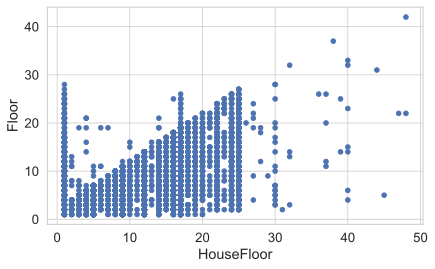

In [184]:
draw_scatter('HouseFloor', 'Floor', train_df)

Поправим значения этажей, которые выше общего количества этажей в доме: сначала поменяем на моду, а затем ещё раз проверим и "обрежем" последним этажом

In [186]:
train_df.loc[train_df['Floor'] >= train_df['HouseFloor'], 'Floor'] = train_df['HouseFloor'].mode()[0]
test_df.loc[test_df['Floor'] >= test_df['HouseFloor'], 'Floor'] = train_df['HouseFloor'].mode()[0]

train_df.loc[train_df['Floor'] >= train_df['HouseFloor'], 'Floor'] = train_df['HouseFloor']
test_df.loc[test_df['Floor'] >= test_df['HouseFloor'], 'Floor'] = test_df['HouseFloor']

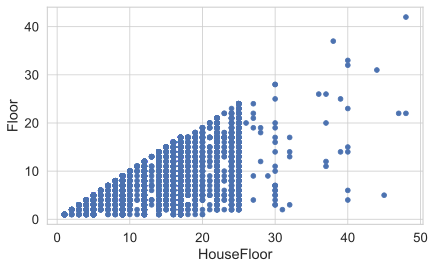

In [187]:
draw_scatter('HouseFloor', 'Floor', train_df)

### Добавление новых признаков

#### PriceOneSqMeter

In [189]:
train_df['PriceOneSqMeter'] = train_df['Price'] / train_df['Square']
train_df['PriceOneSqMeter'].describe()

count    10000.000000
mean      3892.159132
std       1251.627018
min        752.588644
25%       2917.333467
50%       3908.649342
75%       4690.653758
max      11854.652892
Name: PriceOneSqMeter, dtype: float64

#### PriceOneLifeSqMeter

In [190]:
train_df['PriceOneLifeSqMeter'] = train_df['Price'] / train_df['LifeSquare']
train_df['PriceOneLifeSqMeter'].describe()

count     10000.000000
mean       7634.013673
std       13484.304195
min         537.979605
25%        4365.249391
50%        6208.024332
75%        7889.550641
max      525534.823196
Name: PriceOneLifeSqMeter, dtype: float64

#### PriceOneSqMeterByDistrict

In [199]:
price_by_district = train_df.groupby(['DistrictId'], as_index=False)\
                        .agg({'PriceOneSqMeter':'median'})\
                        .rename(columns={'PriceOneSqMeter':'PriceOneSqMeterByDistrict'})

price_by_district

,DistrictId,PriceOneSqMeterByDistrict
0,0,3935.906409
1,1,3251.647396
2,2,4550.709250
3,3,3892.203737
4,4,5716.888354
...,...,...
200,202,7447.527733
201,205,5101.016598
202,207,5550.678339
203,208,8005.605047


In [200]:
train_df = train_df.merge(price_by_district, on=['DistrictId'], how='left').set_index(train_df.index)
test_df = test_df.merge(price_by_district, on=['DistrictId'], how='left').set_index(test_df.index)

#### PriceOneLifeSqMeterByDistrict

In [201]:
price_life_by_district = train_df.groupby(['DistrictId'], as_index=False)\
                        .agg({'PriceOneLifeSqMeter':'median'})\
                        .rename(columns={'PriceOneLifeSqMeter':'PriceOneLifeSqMeterByDistrict'})

price_life_by_district

,DistrictId,PriceOneLifeSqMeterByDistrict
0,0,6315.591326
1,1,4713.708410
2,2,7475.649265
3,3,6288.503242
4,4,8410.146249
...,...,...
200,202,10625.057305
201,205,11814.557800
202,207,7641.851906
203,208,12913.668081


In [202]:
train_df = train_df.merge(price_life_by_district, on=['DistrictId'], how='left').set_index(train_df.index)
test_df = test_df.merge(price_life_by_district, on=['DistrictId'], how='left').set_index(test_df.index)

#### LifeSqToSq

In [193]:
train_df['LifeSqToSq'] = train_df['LifeSquare'] / train_df['Square']
train_df['LifeSqToSq'].describe()

count    10000.000000
mean         0.649060
std          0.176657
min          0.006001
25%          0.574755
50%          0.651895
75%          0.667472
max          5.439478
Name: LifeSqToSq, dtype: float64

In [194]:
test_df['LifeSqToSq'] = test_df['LifeSquare'] / test_df['Square']
test_df['LifeSqToSq'].describe()

count    5000.000000
mean        0.649462
std         0.182627
min         0.002725
25%         0.577238
50%         0.651253
75%         0.668917
max         6.221508
Name: LifeSqToSq, dtype: float64

## Отбор признаков

In [217]:
feature_names = train_df.columns
feature_names.tolist()

['DistrictId',
 'Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'Price',
 'PriceOneSqMeter',
 'PriceOneLifeSqMeter',
 'LifeSqToSq',
 'PriceOneSqMeterByDistrict',
 'PriceOneLifeSqMeterByDistrict']

In [218]:
target_name = ['Price']
feature_names = ['DistrictId',
 'Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
# 'Price',
# 'PriceOneSqMeter',
# 'PriceOneLifeSqMeter',
 'LifeSqToSq',
 'PriceOneSqMeterByDistrict',
 'PriceOneLifeSqMeterByDistrict']

In [219]:
X = train_df[feature_names]
y = train_df[target_name]

X_test = test_df[feature_names]
len(feature_names)

21

## RandomForest

In [221]:
model = RandomForestRegressor(n_estimators = 1000, max_depth = 12, random_state = 42)

In [222]:
kf = KFold(n_splits=5, random_state=42, shuffle=True)

cv_score = cross_val_score(model, X, y, scoring='r2', cv=kf)
print(f'R2: {cv_score.mean()}')

R2: 0.7507749877105167


### Проверим важность признаков

In [224]:
model.fit(X, y)
importances = model.feature_importances_
feat_importances = pd.Series(importances, index=feature_names)
feat_importances.sort_values(ascending=True, inplace=True)

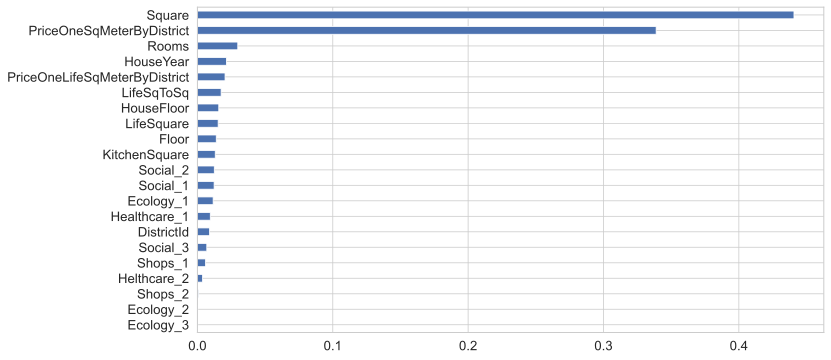

In [225]:
feat_importances.plot(kind='barh', figsize=(10, 6));

### Подберём параметры модели

In [226]:
params = {
    'n_estimators': [400, 500, 800, 1000],
    'max_depth': [18,19,20],
    'max_features': [5,6,7,8,9]
}

In [227]:
forest_grid = GridSearchCV(model, params, scoring='r2', 
                  cv=KFold(n_splits=10, random_state=42, shuffle=True), 
                  n_jobs=-1)
forest_grid.fit(X, y)
print(forest_grid.best_params_)
print(f'R2: {forest_grid.best_score_}')
# {'max_depth': 19, 'max_features': 6, 'n_estimators': 800}
# R2: 0.7612967829412951

{'max_depth': 19, 'max_features': 6, 'n_estimators': 800}
R2: 0.7612967829412951


## Прогнозируем на test-е

In [230]:
forest_best = forest_grid.best_estimator_

RandomForestRegressor(max_depth=19, max_features=6, n_estimators=800,
                      random_state=42)

In [235]:
y_pred = forest_best.predict(X_test)

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

### Разберёмся с ошибкой

In [233]:
train_df.isna().sum()[train_df.isna().sum() != 0]

Series([], dtype: int64)

In [236]:
X_test.describe()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,...,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,LifeSqToSq,PriceOneSqMeterByDistrict,PriceOneLifeSqMeterByDistrict
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,...,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,4992.000000,4992.000000
mean,51.279200,1.906200,56.528124,36.868578,7.363800,7.976200,13.03000,1984.392600,0.119874,0.990400,...,24.933800,5406.900000,8.262600,1029.396400,1.31940,4.242800,0.917600,0.649462,3945.837045,6189.140428
std,44.179466,0.805935,18.974753,16.902438,2.660764,5.132729,6.38483,18.573149,0.120070,0.097518,...,17.532202,4026.614773,23.863762,766.595258,1.47994,4.777365,0.275001,0.182627,986.103424,1685.122711
min,0.000000,1.000000,13.305531,0.333490,3.000000,1.000000,1.00000,1908.000000,0.000000,0.000000,...,0.000000,168.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.002725,2273.498737,3290.908909
25%,21.000000,1.000000,41.940806,24.801216,6.000000,4.000000,9.00000,1973.000000,0.019509,1.000000,...,6.000000,1564.000000,0.000000,810.000000,0.00000,1.000000,1.000000,0.577238,2949.975415,4418.806685
50%,37.000000,2.000000,52.921340,33.782979,6.000000,7.000000,14.00000,1977.000000,0.072158,1.000000,...,25.000000,5285.000000,2.000000,900.000000,1.00000,3.000000,1.000000,0.651253,4158.187979,6665.244982
75%,77.000000,2.000000,66.285129,45.336693,9.000000,12.000000,17.00000,2000.000000,0.195781,1.000000,...,36.000000,7287.000000,5.000000,990.000000,2.00000,6.000000,1.000000,0.668917,4571.660177,7367.642393
max,212.000000,5.000000,223.453689,303.071094,60.000000,46.000000,48.00000,2020.000000,0.521867,1.000000,...,74.000000,19083.000000,141.000000,4849.000000,6.00000,23.000000,1.000000,6.221508,8700.768533,13929.502092


In [238]:
X_test.count()

DistrictId                       5000
Rooms                            5000
Square                           5000
LifeSquare                       5000
KitchenSquare                    5000
Floor                            5000
HouseFloor                       5000
HouseYear                        5000
Ecology_1                        5000
Ecology_2                        5000
Ecology_3                        5000
Social_1                         5000
Social_2                         5000
Social_3                         5000
Healthcare_1                     5000
Helthcare_2                      5000
Shops_1                          5000
Shops_2                          5000
LifeSqToSq                       5000
PriceOneSqMeterByDistrict        4992
PriceOneLifeSqMeterByDistrict    4992
dtype: int64

Часть новых данных оказалось неверно заполненно, по-этому заполним пропуски медианным значением с train-а

In [239]:
X_test['PriceOneSqMeterByDistrict'].fillna(train_df['PriceOneSqMeterByDistrict'].median(), inplace=True)
X_test['PriceOneLifeSqMeterByDistrict'].fillna(train_df['PriceOneLifeSqMeterByDistrict'].median(), inplace=True)

In [240]:
X_test.count()

DistrictId                       5000
Rooms                            5000
Square                           5000
LifeSquare                       5000
KitchenSquare                    5000
Floor                            5000
HouseFloor                       5000
HouseYear                        5000
Ecology_1                        5000
Ecology_2                        5000
Ecology_3                        5000
Social_1                         5000
Social_2                         5000
Social_3                         5000
Healthcare_1                     5000
Helthcare_2                      5000
Shops_1                          5000
Shops_2                          5000
LifeSqToSq                       5000
PriceOneSqMeterByDistrict        5000
PriceOneLifeSqMeterByDistrict    5000
dtype: int64

### Пробуем ещё раз

In [241]:
y_pred = forest_best.predict(X_test)

In [242]:
preds = pd.DataFrame()
preds['Id'] = X_test.index
preds['Price'] = y_pred
preds.head()

,Id,Price
0,725,154010.889213
1,15856,226059.087620
2,5480,284108.344968
3,15664,302484.772752
4,14275,146999.080586


In [243]:
preds.to_csv('DMFilippov_predictions.csv', index=False)